# Importing the required libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from bs4 import BeautifulSoup
import re
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Importing the dataset

In [2]:
df = pd.read_csv('Productdetails.csv')

In [3]:
df

,Text_ID,Product_Description,Product_Type,Sentiment
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2
2,8212,Crazy that Apple is opening a temporary store ...,9,2
3,4422,The lesson from Google One Pass: In this digit...,9,2
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2
...,...,...,...,...
6359,2945,Thanks @mention for hosting this event #sxsw #...,9,2
6360,4528,"SXSW iPhone app is awesome, but iPad app crash...",7,1
6361,6526,RT @mention RT @mention Download 20+ free trac...,9,2
6362,2110,OH at Texas Social Media Awards: 'You don't ne...,9,2


In [4]:
df.shape

(6364, 4)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6364 entries, 0 to 6363
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Text_ID              6364 non-null   int64 
 1   Product_Description  6364 non-null   object
 2   Product_Type         6364 non-null   int64 
 3   Sentiment            6364 non-null   int64 
dtypes: int64(3), object(1)
memory usage: 199.0+ KB


In [6]:
df.describe()

,Text_ID,Product_Type,Sentiment
count,6364.000000,6364.000000,6364.000000
mean,4568.862822,7.462445,2.230673
std,2621.198346,2.440492,0.638413
min,1.000000,0.000000,0.000000
25%,2297.750000,6.000000,2.000000
50%,4587.500000,9.000000,2.000000
75%,6827.500000,9.000000,3.000000
max,9092.000000,9.000000,3.000000


In [7]:
df['Product_Type'].value_counts()

9    4070
6     665
2     465
7     327
3     300
5     213
8     194
1      59
0      52
4      19
Name: Product_Type, dtype: int64

# Visualizing some information from Raw data

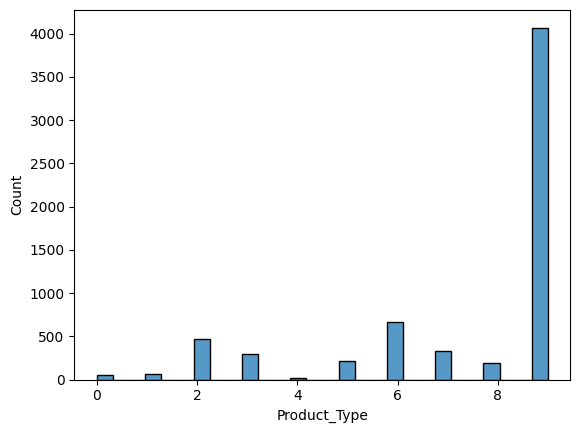

In [8]:
sns.histplot(df['Product_Type'])
plt.show()

In [9]:
# Plotting a customized Pie Chart
values = df['Product_Type'].value_counts()     # Counting the unique values frequency
labels = df['Product_Type'].unique().tolist()  # Creating the unique value labels
explode = (0.1, 0, 0, 0, 0, 0, 0, 0, 0, 0)     # Explodig the first slice

([<matplotlib.patches.Wedge at 0x249d4460550>,
 [Text(-0.5093480623088893, 1.0865378739014024, '9'),
  Text(-0.3934610751717169, -1.0272236281962739, '6'),
  Text(0.20993732222908174, -1.07978068177537, '7'),
  Text(0.6055852680850862, -0.9182954225511061, '2'),
  Text(0.8565212032839985, -0.6901966591667419, '8'),
  Text(1.0021275639908547, -0.45358609490344337, '3'),
  Text(1.0724897166982796, -0.2444704636074552, '0'),
  Text(1.0945894982598083, -0.10896710650164619, '5'),
  Text(1.0989145371679427, -0.04885529654977469, '1'),
  Text(1.0999516158821747, -0.010317108034384714, '4')])

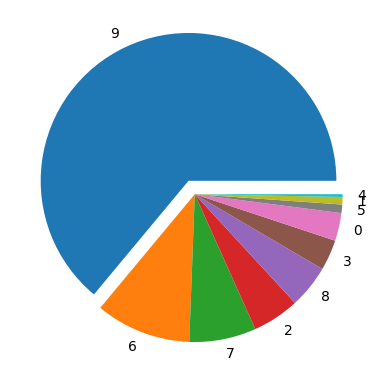

In [10]:
#Creating the pie chart with included exploding slice
plt.pie(values, labels = labels, explode = explode, radius = 1)

In [11]:
plt.show()
print(values)

9    4070
6     665
2     465
7     327
3     300
5     213
8     194
1      59
0      52
4      19
Name: Product_Type, dtype: int64


In [12]:
# WordClouf from RawD ata
wordc = ' '.join(df['Product_Description'])

In [13]:
def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");

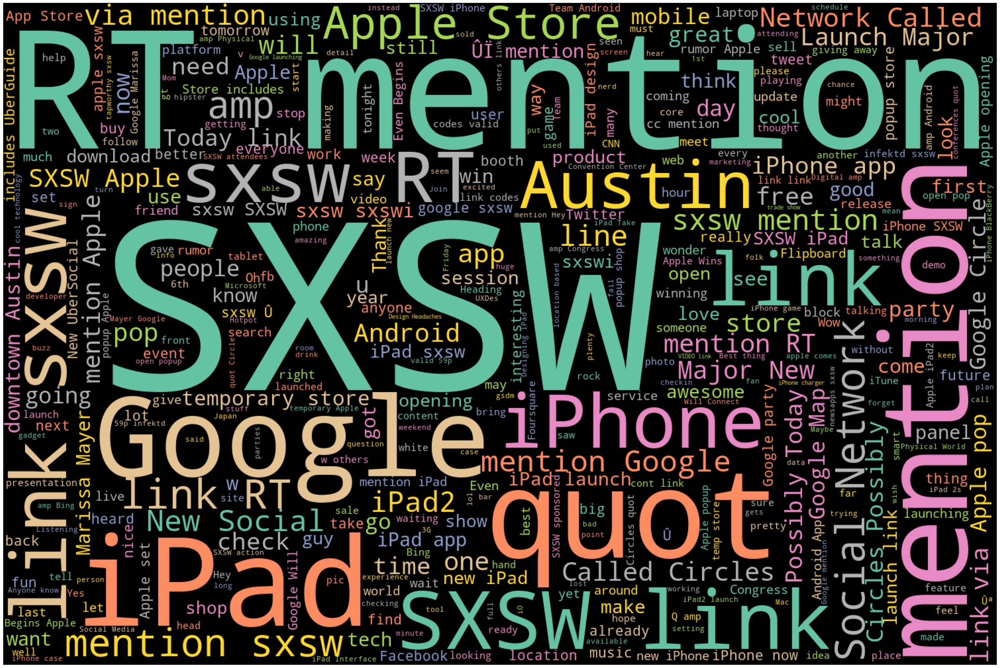

In [14]:
# Generate wordcloud
wordcloud = WordCloud(width = 1500, height = 1000, background_color='black', max_words=400,colormap='Set2').generate(wordc)
# Plot
plot_cloud(wordcloud)

In [15]:
# Top 20 Most Common words from above wordcloud i.e., Raw Data

from collections import Counter
p = Counter(" ".join(df['Product_Description']).split()).most_common(20)
result = pd.DataFrame(p, columns=['Word', 'Frequency'])
print(result)

        Word  Frequency
0   @mention       4710
1     {link}       3013
2      #sxsw       2808
3        the       2699
4      #SXSW       2532
5         to       2426
6         at       2031
7         RT       2028
8        for       1677
9          a       1495
10        in       1247
11        of       1182
12    Google       1178
13      iPad       1165
14        is       1145
15       and       1051
16     Apple        990
17        on        852
18         I        693
19         -        651


In [16]:
counter = []

In [17]:
for string in df.Product_Description:
    counter.append(string.count(' ') + 1) #num of spaces + 1

df['num_words'] = counter #add the column

In [18]:
df.head(5)

,Text_ID,Product_Description,Product_Type,Sentiment,num_words
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2,15
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2,24
2,8212,Crazy that Apple is opening a temporary store ...,9,2,20
3,4422,The lesson from Google One Pass: In this digit...,9,2,22
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2,14


# Cleaning the dataset
# Text Preprocessing Techniques

In [19]:
df['Product_Description'].head(10)

0    The Web DesignerÛªs Guide to iOS (and Android...
1    RT @mention Line for iPad 2 is longer today th...
2    Crazy that Apple is opening a temporary store ...
3    The lesson from Google One Pass: In this digit...
4    RT @mention At the panel: &quot;Your mom has a...
5    RT @mention I think my effing hubby is in line...
6    &quot;Android users are not iPhone users. (The...
7    Wow! RT@mention We interrupt your regularly sc...
8    Google to Launch New Social Network Called Cir...
9    @mention  Welcome! Enjoy #Sxsw and ride anywhe...
Name: Product_Description, dtype: object

# Cleaning Data

In [20]:
def cleantext(text):
    text = re.sub(r"â€™", "", text)             # Remove Mentions
    text = re.sub(r"#", "", text)               # Remove Hashtags Symbol
    text = re.sub(r"\w*\d\w*", "", text)        # Remove numbers
    text = re.sub(r"https?:\/\/\S+", "", text)  # Remove The Hyper Link
    text = re.sub(r"______________", "", text)  # Remove _____
    text=re.sub(r"^a-zA-z0-9","",text)
    text=re.sub(r"[^\w\s]","",text)
    
    return text

In [21]:
from nltk.tokenize import word_tokenize

In [22]:
df['clean_text'] = df.apply(lambda x: cleantext(x['Product_Description']),axis=1)

In [23]:
df['clean_text']

0       The Web DesignerÛªs Guide to iOS and Android A...
1       RT mention Line for iPad  is longer today than...
2       Crazy that Apple is opening a temporary store ...
3       The lesson from Google One Pass In this digita...
4       RT mention At the panel quotYour mom has an ip...
                              ...                        
6359    Thanks mention for hosting this event sxsw sxs...
6360    SXSW iPhone app is awesome but iPad app crashe...
6361    RT mention RT mention Download  free tracks fr...
6362    OH at Texas Social Media Awards You dont need ...
6363    Google launching a quotmajorquot new social ne...
Name: clean_text, Length: 6364, dtype: object

# Contractions

In [24]:
import contractions

In [25]:
df['no_contract'] = df['clean_text'].apply(lambda x: [contractions.fix(word) for word in x.split()])

In [26]:
df['no_contract']

0       [The, Web, DesignerÛªs, Guide, to, iOS, and, A...
1       [RT, mention, Line, for, iPad, is, longer, tod...
2       [Crazy, that, Apple, is, opening, a, temporary...
3       [The, lesson, from, Google, One, Pass, In, thi...
4       [RT, mention, At, the, panel, quotYour, mom, h...
                              ...                        
6359    [Thanks, mention, for, hosting, this, event, s...
6360    [SXSW, iPhone, app, is, awesome, but, iPad, ap...
6361    [RT, mention, RT, mention, Download, free, tra...
6362    [OH, at, Texas, Social, Media, Awards, You, do...
6363    [Google, launching, a, quotmajorquot, new, soc...
Name: no_contract, Length: 6364, dtype: object

In [27]:
df.head(5)

,Text_ID,Product_Description,Product_Type,Sentiment,num_words,clean_text,no_contract
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2,15,The Web DesignerÛªs Guide to iOS and Android A...,"[The, Web, DesignerÛªs, Guide, to, iOS, and, A..."
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2,24,RT mention Line for iPad is longer today than...,"[RT, mention, Line, for, iPad, is, longer, tod..."
2,8212,Crazy that Apple is opening a temporary store ...,9,2,20,Crazy that Apple is opening a temporary store ...,"[Crazy, that, Apple, is, opening, a, temporary..."
3,4422,The lesson from Google One Pass: In this digit...,9,2,22,The lesson from Google One Pass In this digita...,"[The, lesson, from, Google, One, Pass, In, thi..."
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2,14,RT mention At the panel quotYour mom has an ip...,"[RT, mention, At, the, panel, quotYour, mom, h..."


# Tokenization

In [28]:
from nltk.tokenize import word_tokenize

In [29]:
df['tokenized'] = df['clean_text'].apply(word_tokenize)

In [30]:
df['tokenized']

0       [The, Web, DesignerÛªs, Guide, to, iOS, and, A...
1       [RT, mention, Line, for, iPad, is, longer, tod...
2       [Crazy, that, Apple, is, opening, a, temporary...
3       [The, lesson, from, Google, One, Pass, In, thi...
4       [RT, mention, At, the, panel, quotYour, mom, h...
                              ...                        
6359    [Thanks, mention, for, hosting, this, event, s...
6360    [SXSW, iPhone, app, is, awesome, but, iPad, ap...
6361    [RT, mention, RT, mention, Download, free, tra...
6362    [OH, at, Texas, Social, Media, Awards, You, do...
6363    [Google, launching, a, quotmajorquot, new, soc...
Name: tokenized, Length: 6364, dtype: object

In [31]:
df['lower'] = df['tokenized'].apply(lambda x: [word.lower() for word in x])

In [32]:
df['lower']

0       [the, web, designerûªs, guide, to, ios, and, a...
1       [rt, mention, line, for, ipad, is, longer, tod...
2       [crazy, that, apple, is, opening, a, temporary...
3       [the, lesson, from, google, one, pass, in, thi...
4       [rt, mention, at, the, panel, quotyour, mom, h...
                              ...                        
6359    [thanks, mention, for, hosting, this, event, s...
6360    [sxsw, iphone, app, is, awesome, but, ipad, ap...
6361    [rt, mention, rt, mention, download, free, tra...
6362    [oh, at, texas, social, media, awards, you, do...
6363    [google, launching, a, quotmajorquot, new, soc...
Name: lower, Length: 6364, dtype: object

In [33]:
# Joining df['lower']
df['lower'] = [' '.join(map(str,i)) for i in df['lower']]

In [34]:
df.head(5)

,Text_ID,Product_Description,Product_Type,Sentiment,num_words,clean_text,no_contract,tokenized,lower
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2,15,The Web DesignerÛªs Guide to iOS and Android A...,"[The, Web, DesignerÛªs, Guide, to, iOS, and, A...","[The, Web, DesignerÛªs, Guide, to, iOS, and, A...",the web designerûªs guide to ios and android a...
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2,24,RT mention Line for iPad is longer today than...,"[RT, mention, Line, for, iPad, is, longer, tod...","[RT, mention, Line, for, iPad, is, longer, tod...",rt mention line for ipad is longer today than ...
2,8212,Crazy that Apple is opening a temporary store ...,9,2,20,Crazy that Apple is opening a temporary store ...,"[Crazy, that, Apple, is, opening, a, temporary...","[Crazy, that, Apple, is, opening, a, temporary...",crazy that apple is opening a temporary store ...
3,4422,The lesson from Google One Pass: In this digit...,9,2,22,The lesson from Google One Pass In this digita...,"[The, lesson, from, Google, One, Pass, In, thi...","[The, lesson, from, Google, One, Pass, In, thi...",the lesson from google one pass in this digita...
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2,14,RT mention At the panel quotYour mom has an ip...,"[RT, mention, At, the, panel, quotYour, mom, h...","[RT, mention, At, the, panel, quotYour, mom, h...",rt mention at the panel quotyour mom has an ip...


# Stopwords

In [35]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

In [36]:
import nltk
from nltk.corpus import stopwords
from wordcloud import STOPWORDS

In [37]:
df['lower'] = df['lower'].apply(word_tokenize)

In [38]:
# Joining df['lower']
df['lower'] = [' '.join(map(str,i)) for i in df['lower']]

In [39]:
# Generate wordcloud
stopwords = nltk.corpus.stopwords.words('english')
newStopWords = ["SXSW", "sxsw", "link","iPhone", "upad", "Apple popup" , "RT mention", "RT", "sxsw sxsw", "Google", "DesignerÛªs" , "link sxsw", "iPad launch", "Social Network", "sxsw apple", "amp","mention google", "via mention", "called circles" , "popup store", "link via", "sxsw sxswi", "downtown austin", "ûïmention" , "sxswi", "marissa mayer", "an iPad", "Circles Possibly", "Austin for","new iPad", "iPad at", "temporary store" , "New UberSocial", "Apple i", "Apple", "popup store", "in Austin", "Called Circles", "Network Called", "Social Network", "Austin","iPad", "Apple Store", "New Social", "sxswÛ", "Facebook", "Circles Possibly", "downtown Austin", "ipad design", "designerûªs", "Marissa Mayer"] + list(stopwords)

wordc = ' '.join(df['clean_text'])

In [40]:
print(stopwords)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [41]:
print(newStopWords)

['SXSW', 'sxsw', 'link', 'iPhone', 'upad', 'Apple popup', 'RT mention', 'RT', 'sxsw sxsw', 'Google', 'DesignerÛªs', 'link sxsw', 'iPad launch', 'Social Network', 'sxsw apple', 'amp', 'mention google', 'via mention', 'called circles', 'popup store', 'link via', 'sxsw sxswi', 'downtown austin', 'ûïmention', 'sxswi', 'marissa mayer', 'an iPad', 'Circles Possibly', 'Austin for', 'new iPad', 'iPad at', 'temporary store', 'New UberSocial', 'Apple i', 'Apple', 'popup store', 'in Austin', 'Called Circles', 'Network Called', 'Social Network', 'Austin', 'iPad', 'Apple Store', 'New Social', 'sxswÛ', 'Facebook', 'Circles Possibly', 'downtown Austin', 'ipad design', 'designerûªs', 'Marissa Mayer', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'wh

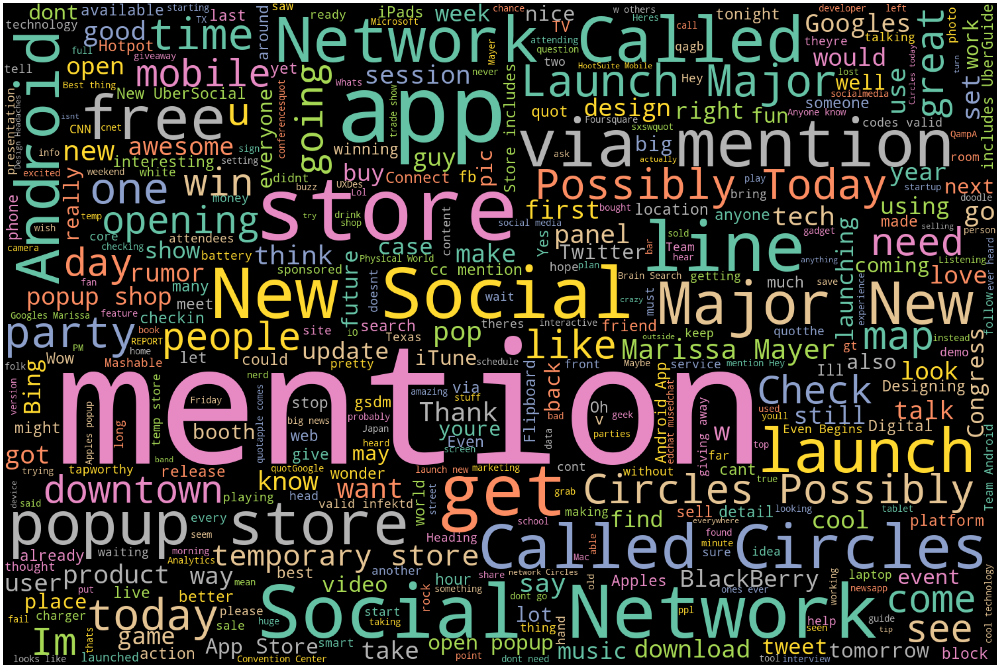

In [42]:
# Generate wordcloud
wordcloud = WordCloud(width = 1500, height = 1000, background_color='black',stopwords=newStopWords, max_words=400,colormap='Set2').generate(wordc)
# Plot
plot_cloud(wordcloud)

In [43]:
print(wordcloud.words_.keys())

dict_keys(['mention', 'app', 'store', 'Social Network', 'get', 'New Social', 'line', 'via mention', 'Network Called', 'Called Circles', 'popup store', 'launch', 'Android', 'free', 'Major New', 'Launch Major', 'one', 'party', 'today', 'time', 'Possibly Today', 'Circles Possibly', 'map', 'like', 'Check', 'need', 'people', 'u', 'Im', 'win', 'day', 'great', 'opening', 'downtown', 'come', 'going', 'mobile', 'see', 'temporary store', 'new', 'want', 'Marissa Mayer', 'pop', 'use', 'good', 'say', 'Thank', 'think', 'tech', 'w', 'go', 'set', 'product', 'know', 'got', 'panel', 'talk', 'make', 'awesome', 'first', 'session', 'Googles', 'rumor', 'guy', 'cool', 'popup shop', 'open', 'download', 'game', 'year', 'user', 'take', 'still', 'love', 'would', 'design', 'way', 'look', 'update', 'music', 'BlackBerry', 'buy', 'case', 'show', 'launching', 'Congress', 'using', 'week', 'right', 'Bing', 'find', 'tweet', 'video', 'future', 'App Store', 'event', 'dont', 'open popup', 'booth', 'next', 'youre', 'everyon

In [44]:
df.head(5)

,Text_ID,Product_Description,Product_Type,Sentiment,num_words,clean_text,no_contract,tokenized,lower
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2,15,The Web DesignerÛªs Guide to iOS and Android A...,"[The, Web, DesignerÛªs, Guide, to, iOS, and, A...","[The, Web, DesignerÛªs, Guide, to, iOS, and, A...",the web designerûªs guide to ios and android a...
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2,24,RT mention Line for iPad is longer today than...,"[RT, mention, Line, for, iPad, is, longer, tod...","[RT, mention, Line, for, iPad, is, longer, tod...",rt mention line for ipad is longer today than ...
2,8212,Crazy that Apple is opening a temporary store ...,9,2,20,Crazy that Apple is opening a temporary store ...,"[Crazy, that, Apple, is, opening, a, temporary...","[Crazy, that, Apple, is, opening, a, temporary...",crazy that apple is opening a temporary store ...
3,4422,The lesson from Google One Pass: In this digit...,9,2,22,The lesson from Google One Pass In this digita...,"[The, lesson, from, Google, One, Pass, In, thi...","[The, lesson, from, Google, One, Pass, In, thi...",the lesson from google one pass in this digita...
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2,14,RT mention At the panel quotYour mom has an ip...,"[RT, mention, At, the, panel, quotYour, mom, h...","[RT, mention, At, the, panel, quotYour, mom, h...",rt mention at the panel quotyour mom has an ip...


# Creating a new Column having no Stopwords

In [45]:
stops = r'\b({})\b'.format('|'.join(newStopWords))
df['nostop'] = df['lower'].str.replace(stops, '').str.replace('\s+', ' ')
df.head()

C:\Users\mayur\AppData\Local\Temp\ipykernel_14032\2467886739.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  df['nostop'] = df['lower'].str.replace(stops, '').str.replace('\s+', ' ')


,Text_ID,Product_Description,Product_Type,Sentiment,num_words,clean_text,no_contract,tokenized,lower,nostop
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2,15,The Web DesignerÛªs Guide to iOS and Android A...,"[The, Web, DesignerÛªs, Guide, to, iOS, and, A...","[The, Web, DesignerÛªs, Guide, to, iOS, and, A...",the web designerûªs guide to ios and android a...,web guide ios android apps today mention
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2,24,RT mention Line for iPad is longer today than...,"[RT, mention, Line, for, iPad, is, longer, tod...","[RT, mention, Line, for, iPad, is, longer, tod...",rt mention line for ipad is longer today than ...,rt mention line ipad longer today yesterday ge...
2,8212,Crazy that Apple is opening a temporary store ...,9,2,20,Crazy that Apple is opening a temporary store ...,"[Crazy, that, Apple, is, opening, a, temporary...","[Crazy, that, Apple, is, opening, a, temporary...",crazy that apple is opening a temporary store ...,crazy apple opening austin tomorrow handle rab...
3,4422,The lesson from Google One Pass: In this digit...,9,2,22,The lesson from Google One Pass In this digita...,"[The, lesson, from, Google, One, Pass, In, thi...","[The, lesson, from, Google, One, Pass, In, thi...",the lesson from google one pass in this digita...,lesson google one pass digital environment us...
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2,14,RT mention At the panel quotYour mom has an ip...,"[RT, mention, At, the, panel, quotYour, mom, h...","[RT, mention, At, the, panel, quotYour, mom, h...",rt mention at the panel quotyour mom has an ip...,rt mention panel quotyour mom ipad designing b...


# Stemming

In [46]:
from nltk.stem import PorterStemmer

In [47]:
st = PorterStemmer()
# Stemming every word
df['stemmed'] = df['nostop'].apply(lambda x: ' '.join([st.stem(word) for word in x.split()]))

In [48]:
df['stemmed']

0                   web guid io android app today mention
1       rt mention line ipad longer today yesterday ge...
2       crazi appl open austin tomorrow handl rabid ey...
3       lesson googl one pass digit environ user want ...
4       rt mention panel quotyour mom ipad design boom...
                              ...                        
6359                             thank mention host event
6360           iphon app awesom ipad app crash everi time
6361    rt mention rt mention download free track ment...
6362    oh texa social media award dont need ask mothe...
6363    googl launch quotmajorquot new social network ...
Name: stemmed, Length: 6364, dtype: object

# Lemmatization

In [49]:
from textblob import Word

In [50]:
df['lemma'] =df['stemmed'].apply(lambda x: " ".join([Word(word).lemmatize() for word in x.split()]))

In [51]:
stops = r'\b({})\b'.format('|'.join(newStopWords))
df['lemma'] = df['lemma'].str.replace(stops, '').str.replace('\s+', ' ')
df.head

C:\Users\mayur\AppData\Local\Temp\ipykernel_14032\28181238.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  df['lemma'] = df['lemma'].str.replace(stops, '').str.replace('\s+', ' ')


<bound method NDFrame.head of       Text_ID                                Product_Description  \
0        3057  The Web DesignerÛªs Guide to iOS (and Android...   
1        6254  RT @mention Line for iPad 2 is longer today th...   
2        8212  Crazy that Apple is opening a temporary store ...   
3        4422  The lesson from Google One Pass: In this digit...   
4        5526  RT @mention At the panel: &quot;Your mom has a...   
...       ...                                                ...   
6359     2945  Thanks @mention for hosting this event #sxsw #...   
6360     4528  SXSW iPhone app is awesome, but iPad app crash...   
6361     6526  RT @mention RT @mention Download 20+ free trac...   
6362     2110  OH at Texas Social Media Awards: 'You don't ne...   
6363     2177  #Google launching a &quot;major&quot; new soci...   

      Product_Type  Sentiment  num_words  \
0                9          2         15   
1                9          2         24   
2                9   

In [52]:
df.head()

,Text_ID,Product_Description,Product_Type,Sentiment,num_words,clean_text,no_contract,tokenized,lower,nostop,stemmed,lemma
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2,15,The Web DesignerÛªs Guide to iOS and Android A...,"[The, Web, DesignerÛªs, Guide, to, iOS, and, A...","[The, Web, DesignerÛªs, Guide, to, iOS, and, A...",the web designerûªs guide to ios and android a...,web guide ios android apps today mention,web guid io android app today mention,web guid io android app today mention
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2,24,RT mention Line for iPad is longer today than...,"[RT, mention, Line, for, iPad, is, longer, tod...","[RT, mention, Line, for, iPad, is, longer, tod...",rt mention line for ipad is longer today than ...,rt mention line ipad longer today yesterday ge...,rt mention line ipad longer today yesterday ge...,rt mention line ipad longer today yesterday ge...
2,8212,Crazy that Apple is opening a temporary store ...,9,2,20,Crazy that Apple is opening a temporary store ...,"[Crazy, that, Apple, is, opening, a, temporary...","[Crazy, that, Apple, is, opening, a, temporary...",crazy that apple is opening a temporary store ...,crazy apple opening austin tomorrow handle rab...,crazi appl open austin tomorrow handl rabid ey...,crazi appl open austin tomorrow handl rabid ey...
3,4422,The lesson from Google One Pass: In this digit...,9,2,22,The lesson from Google One Pass In this digita...,"[The, lesson, from, Google, One, Pass, In, thi...","[The, lesson, from, Google, One, Pass, In, thi...",the lesson from google one pass in this digita...,lesson google one pass digital environment us...,lesson googl one pass digit environ user want ...,lesson googl one pas digit environ user want p...
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2,14,RT mention At the panel quotYour mom has an ip...,"[RT, mention, At, the, panel, quotYour, mom, h...","[RT, mention, At, the, panel, quotYour, mom, h...",rt mention at the panel quotyour mom has an ip...,rt mention panel quotyour mom ipad designing b...,rt mention panel quotyour mom ipad design boom...,rt mention panel quotyour mom boomersquot


# Top 20 words Bi-Gram

In [53]:
def top_2_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(2,2),  #for tri-gram, put ngram_range=(3,3)
            max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in     
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                reverse=True)
    return words_freq[:n]

In [54]:
from sklearn.feature_extraction.text import CountVectorizer
top2_words = top_2_words(df["lemma"], n=200) #top 200
top2_df = pd.DataFrame(top2_words)
top2_df.columns=["Bi-gram", "Freq"]
top2_df.head(20)

,Bi-gram,Freq
0,rt mention,1824
1,mention mention,444
2,appl store,400
3,social network,332
4,new social,295
5,iphon app,229
6,appl open,226
7,major new,204
8,launch major,199
9,mention appl,185


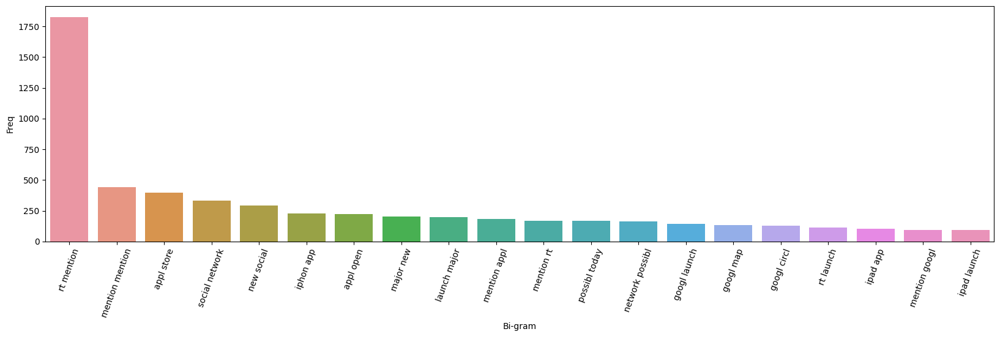

In [55]:
top2_bigram = top2_df.iloc[0:20,:]
fig = plt.figure(figsize = (20, 5))
plot=sns.barplot(x=top2_bigram["Bi-gram"],y=top2_bigram["Freq"]);
plot.set_xticklabels(rotation=70,labels = top2_bigram["Bi-gram"]);

# Tri-Gram of Top 20 Words

In [56]:
def top_3_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(3,3), 
           max_features=2000).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in     
                  vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], 
                reverse=True)
    return words_freq[:n]

In [57]:
top3_words = top_3_words(df["lemma"], n=200)
top3_df = pd.DataFrame(top3_words)
top3_df.columns=["Tri-gram", "Freq"]
top3_df.head(20)

,Tri-gram,Freq
0,new social network,277
1,major new social,204
2,launch major new,199
3,social network possibl,166
4,network possibl today,163
5,rt mention rt,139
6,mention rt mention,135
7,rt mention appl,120
8,rt mention mention,110
9,mention mention mention,93


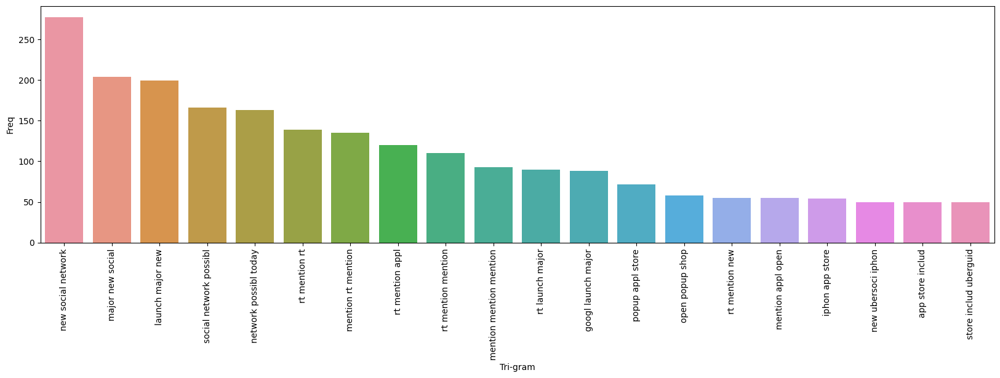

In [58]:
#import seaborn as sns
top20_trigram = top3_df.iloc[0:20,:]
fig = plt.figure(figsize = (20, 5))
plot=sns.barplot(x=top20_trigram["Tri-gram"],y=top20_trigram["Freq"]);
plot.set_xticklabels(rotation=90,labels = top20_trigram["Tri-gram"]);

# Top 20 Common Words

In [59]:
from collections import Counter
p = Counter(" ".join(df['lemma']).split()).most_common(20)
result = pd.DataFrame(p, columns=['Word', 'Frequency'])
print(result)

       Word  Frequency
0   mention       4364
1        rt       2062
2      ipad       1701
3     googl       1573
4      appl       1556
5     iphon       1042
6       new        764
7       app        724
8     store        672
9    launch        609
10   austin        543
11   social        468
12  android        419
13    today        412
14      get        364
15     open        358
16  network        343
17     line        314
18       go        305
19    parti        290


# Polarity & Subjectivity

In [60]:
from textblob import TextBlob

In [61]:
df['Polarity'] = df['Product_Description'].apply(lambda x: TextBlob(x).sentiment.polarity)
df['Subjectivity'] = df['Product_Description'].apply(lambda x: TextBlob(x).sentiment.subjectivity)

In [62]:
# function to analyze the reviews
def getAnalysis(score):
    if score < 0:
        return 'Negative'
    elif score == 0:
        return 'Neutral'
    else:
        return 'Positive'

    
df['Analysis'] = df['Polarity'].apply(getAnalysis)

<AxesSubplot: >

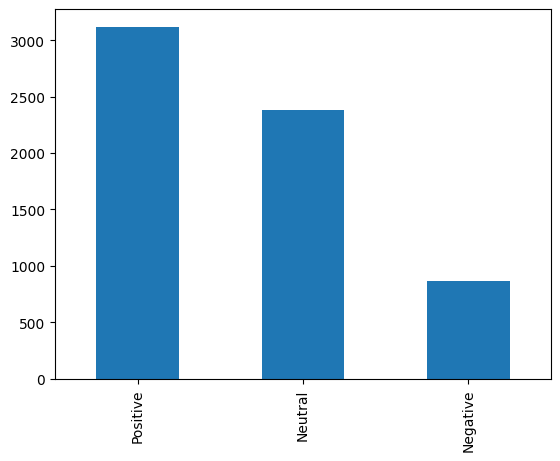

In [63]:
Neutral_senti=df[df['Polarity']==0]
Positive_senti=df[df['Polarity']>0]
Negative_senti=df[df['Polarity']<0]

df['Analysis'].value_counts().plot(kind='bar')

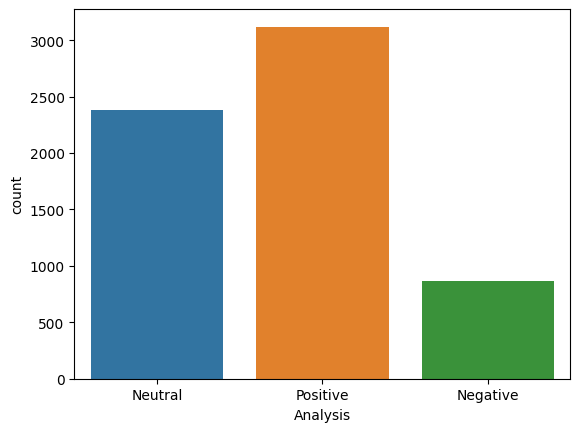

In [64]:
import seaborn as sns
sns.countplot(x='Analysis',data=df)
plt.show()

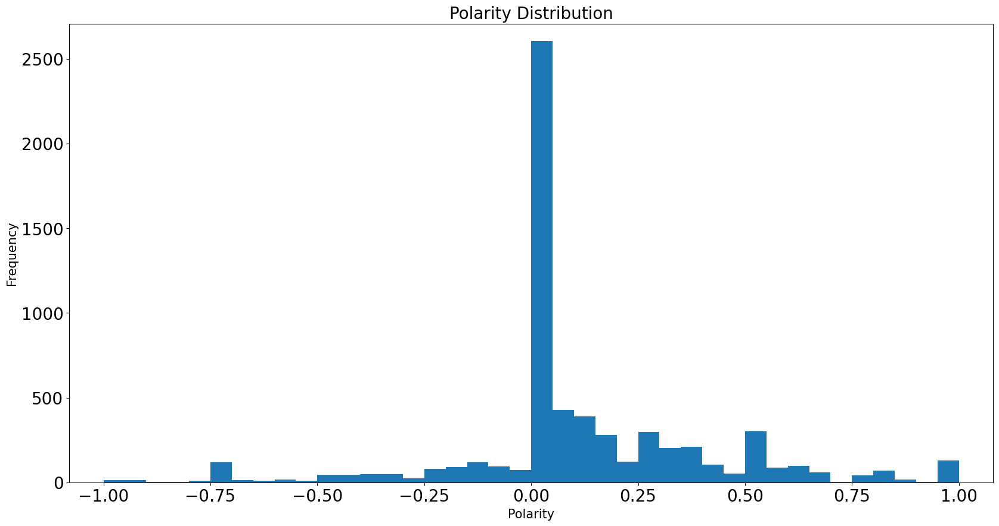

In [65]:
plt.figure(figsize=(20,10))
plt.margins(0.04)
plt.xlabel('Polarity', fontsize=15)
plt.xticks(fontsize=20)
plt.ylabel('Frequency', fontsize=15)
plt.yticks(fontsize=20)
plt.hist(df['Polarity'], bins=40)
plt.title('Polarity Distribution', fontsize=20)
plt.show()

In [66]:
df.pivot_table(columns = ["Product_Type"], values = ["Polarity", "Subjectivity"])

Product_Type,0,1,2,3,4,5,6,7,8,9
Polarity,0.211133,0.229661,0.157881,0.162958,0.427725,0.155544,0.149821,0.225015,0.148490,0.082778
Subjectivity,0.464005,0.432315,0.413536,0.399473,0.700946,0.384955,0.411461,0.519194,0.459542,0.332855


In [67]:
df.pivot_table(columns = ["Sentiment"], values = ["Polarity", "Subjectivity"])

Sentiment,0,1,2,3
Polarity,0.067807,0.009970,0.079866,0.198570
Subjectivity,0.392774,0.411138,0.328524,0.430741


In [68]:
temp = df[['Product_Description','num_words','Product_Type','Sentiment','Polarity','Subjectivity']]

In [69]:
temp

,Product_Description,num_words,Product_Type,Sentiment,Polarity,Subjectivity
0,The Web DesignerÛªs Guide to iOS (and Android...,15,9,2,0.000000,0.000000
1,RT @mention Line for iPad 2 is longer today th...,24,9,2,0.300000,0.200000
2,Crazy that Apple is opening a temporary store ...,20,9,2,-0.600000,0.900000
3,The lesson from Google One Pass: In this digit...,22,9,2,0.000000,0.000000
4,RT @mention At the panel: &quot;Your mom has a...,14,9,2,0.000000,0.000000
...,...,...,...,...,...,...
6359,Thanks @mention for hosting this event #sxsw #...,10,9,2,0.200000,0.200000
6360,"SXSW iPhone app is awesome, but iPad app crash...",12,7,1,1.000000,1.000000
6361,RT @mention RT @mention Download 20+ free trac...,17,9,2,0.500000,0.800000
6362,OH at Texas Social Media Awards: 'You don't ne...,19,9,2,0.033333,0.066667


# Feature Extraction

In [70]:
Positive_senti.head(5)

,Text_ID,Product_Description,Product_Type,Sentiment,num_words,clean_text,no_contract,tokenized,lower,nostop,stemmed,lemma,Polarity,Subjectivity,Analysis
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2,24,RT mention Line for iPad is longer today than...,"[RT, mention, Line, for, iPad, is, longer, tod...","[RT, mention, Line, for, iPad, is, longer, tod...",rt mention line for ipad is longer today than ...,rt mention line ipad longer today yesterday ge...,rt mention line ipad longer today yesterday ge...,rt mention line ipad longer today yesterday ge...,0.300000,0.200000,Positive
7,2975,Wow! RT@mention We interrupt your regularly sc...,9,3,17,Wow RTmention We interrupt your regularly sche...,"[Wow, RTmention, We, interrupt, your, regularl...","[Wow, RTmention, We, interrupt, your, regularl...",wow rtmention we interrupt your regularly sche...,wow rtmention interrupt regularly scheduled ge...,wow rtmention interrupt regularli schedul geek...,wow rtmention interrupt regularli schedul geek...,0.041667,0.392308,Positive
8,818,Google to Launch New Social Network Called Cir...,9,2,14,Google to Launch New Social Network Called Cir...,"[Google, to, Launch, New, Social, Network, Cal...","[Google, to, Launch, New, Social, Network, Cal...",google to launch new social network called cir...,google launch new social network possibly today,googl launch new social network possibl today,googl launch new social network possibl today,0.056566,0.507071,Positive
9,1318,@mention Welcome! Enjoy #Sxsw and ride anywhe...,9,2,19,mention Welcome Enjoy Sxsw and ride anywhere ...,"[mention, Welcome, Enjoy, Sxsw, and, ride, any...","[mention, Welcome, Enjoy, Sxsw, and, ride, any...",mention welcome enjoy sxsw and ride anywhere i...,mention welcome enjoy ride anywhere austin dwn...,mention welcom enjoy ride anywher austin dwnld...,mention welcom enjoy ride anywher austin dwnld...,0.700000,0.700000,Positive
11,1618,Yeay! RT @mention New #UberSocial for #iPhone ...,7,3,20,Yeay RT mention New UberSocial for iPhone now ...,"[Yeay, RT, mention, New, UberSocial, for, iPho...","[Yeay, RT, mention, New, UberSocial, for, iPho...",yeay rt mention new ubersocial for iphone now ...,yeay rt mention new ubersocial iphone app stor...,yeay rt mention new ubersoci iphon app store i...,yeay rt mention new ubersoci iphon app store i...,0.136364,0.454545,Positive


In [71]:
Neutral_senti.head(5)

,Text_ID,Product_Description,Product_Type,Sentiment,num_words,clean_text,no_contract,tokenized,lower,nostop,stemmed,lemma,Polarity,Subjectivity,Analysis
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2,15,The Web DesignerÛªs Guide to iOS and Android A...,"[The, Web, DesignerÛªs, Guide, to, iOS, and, A...","[The, Web, DesignerÛªs, Guide, to, iOS, and, A...",the web designerûªs guide to ios and android a...,web guide ios android apps today mention,web guid io android app today mention,web guid io android app today mention,0.0,0.0,Neutral
3,4422,The lesson from Google One Pass: In this digit...,9,2,22,The lesson from Google One Pass In this digita...,"[The, lesson, from, Google, One, Pass, In, thi...","[The, lesson, from, Google, One, Pass, In, thi...",the lesson from google one pass in this digita...,lesson google one pass digital environment us...,lesson googl one pass digit environ user want ...,lesson googl one pas digit environ user want p...,0.0,0.0,Neutral
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2,14,RT mention At the panel quotYour mom has an ip...,"[RT, mention, At, the, panel, quotYour, mom, h...","[RT, mention, At, the, panel, quotYour, mom, h...",rt mention at the panel quotyour mom has an ip...,rt mention panel quotyour mom ipad designing b...,rt mention panel quotyour mom ipad design boom...,rt mention panel quotyour mom boomersquot,0.0,0.0,Neutral
6,7713,&quot;Android users are not iPhone users. (The...,9,2,16,quotAndroid users are not iPhone users They us...,"[quotAndroid, users, are, not, iPhone, users, ...","[quotAndroid, users, are, not, iPhone, users, ...",quotandroid users are not iphone users they us...,quotandroid users iphone users use options men...,quotandroid user iphon user use option menu co...,quotandroid user iphon user use option menu co...,0.0,0.0,Neutral
10,5454,"RT @mention Apple plans to Keep Austin Wired, ...",9,2,17,RT mention Apple plans to Keep Austin Wired op...,"[RT, mention, Apple, plans, to, Keep, Austin, ...","[RT, mention, Apple, plans, to, Keep, Austin, ...",rt mention apple plans to keep austin wired op...,rt mention apple plans keep austin wired openi...,rt mention appl plan keep austin wire open pop...,rt mention appl plan keep austin wire open pop...,0.0,0.0,Neutral


In [72]:
Negative_senti.head(5)

,Text_ID,Product_Description,Product_Type,Sentiment,num_words,clean_text,no_contract,tokenized,lower,nostop,stemmed,lemma,Polarity,Subjectivity,Analysis
2,8212,Crazy that Apple is opening a temporary store ...,9,2,20,Crazy that Apple is opening a temporary store ...,"[Crazy, that, Apple, is, opening, a, temporary...","[Crazy, that, Apple, is, opening, a, temporary...",crazy that apple is opening a temporary store ...,crazy apple opening austin tomorrow handle rab...,crazi appl open austin tomorrow handl rabid ey...,crazi appl open austin tomorrow handl rabid ey...,-0.600,0.90,Negative
5,6064,RT @mention I think my effing hubby is in line...,6,1,27,RT mention I think my effing hubby is in line ...,"[RT, mention, I, think, my, effing, hubby, is,...","[RT, mention, I, think, my, effing, hubby, is,...",rt mention i think my effing hubby is in line ...,rt mention think effing hubby line ipad someon...,rt mention think ef hubbi line ipad someon poi...,rt mention think ef hubbi line ipad someon poi...,-0.500,0.70,Negative
15,7667,Horrible repressed memories of the Apple spinn...,2,1,16,Horrible repressed memories of the Apple spinn...,"[Horrible, repressed, memories, of, the, Apple...","[Horrible, repressed, memories, of, the, Apple...",horrible repressed memories of the apple spinn...,horrible repressed memories apple spinning bea...,horribl repress memori appl spin beach ball co...,horribl repress memori appl spin beach ball co...,-0.500,0.50,Negative
18,6409,"RT @mention On its second day in business, the...",2,3,24,RT mention On its second day in business the A...,"[RT, mention, On, its, second, day, in, busine...","[RT, mention, On, its, second, day, in, busine...",rt mention on its second day in business the a...,rt mention second day business apple appears t...,rt mention second day busi appl appear trend v...,rt mention second day busi appl appear trend v...,-0.375,0.50,Negative
24,7675,adaptive retail -- apple to open pop-up shop a...,2,3,14,adaptive retail apple to open popup shop at s...,"[adaptive, retail, apple, to, open, popup, sho...","[adaptive, retail, apple, to, open, popup, sho...",adaptive retail apple to open popup shop at sx...,adaptive retail apple open popup shop skillful...,adapt retail appl open popup shop skill done c...,adapt retail appl open popup shop skill done c...,-0.375,0.75,Negative


# Positive reviews WORDCLOUD

In [73]:
from wordcloud import WordCloud
wc = WordCloud(width=500,height=500,min_font_size=10,max_words=300,stopwords=newStopWords,background_color='black')

In [74]:
Positive = wc.generate(df[df['Polarity']>0]['Product_Description'].str.cat(sep=""))

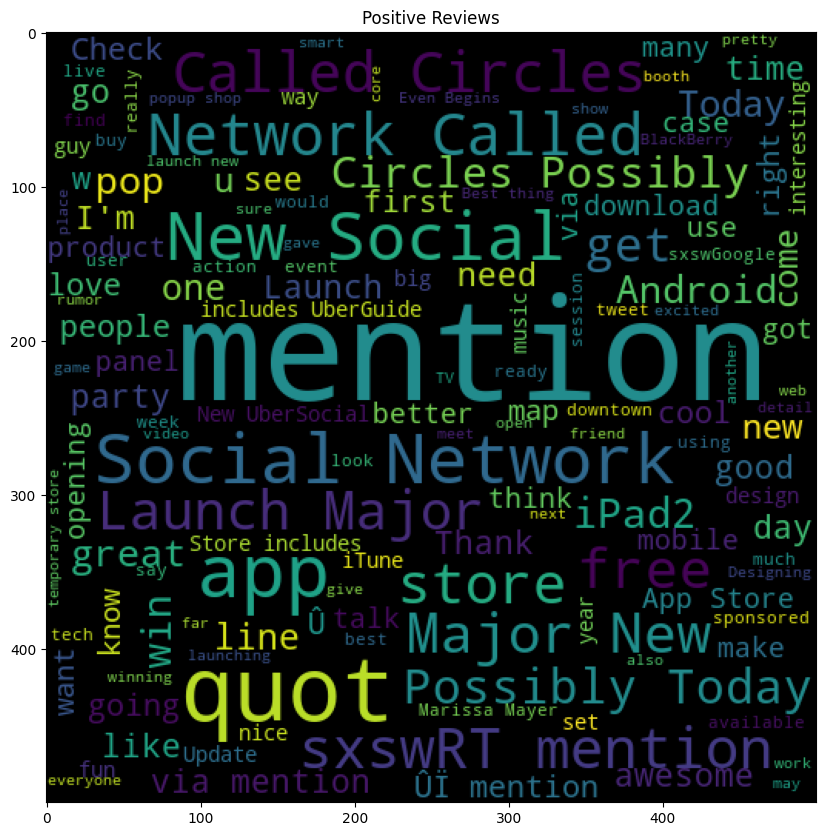

In [75]:
plt.figure(figsize=(10,10))
plt.imshow(Positive)
plt.title('Positive Reviews')
plt.show()

# Negative reviews WORDCLOUD

In [76]:
Negative=wc.generate(df[df['Polarity']<0]['Product_Description'].str.cat(sep=""))

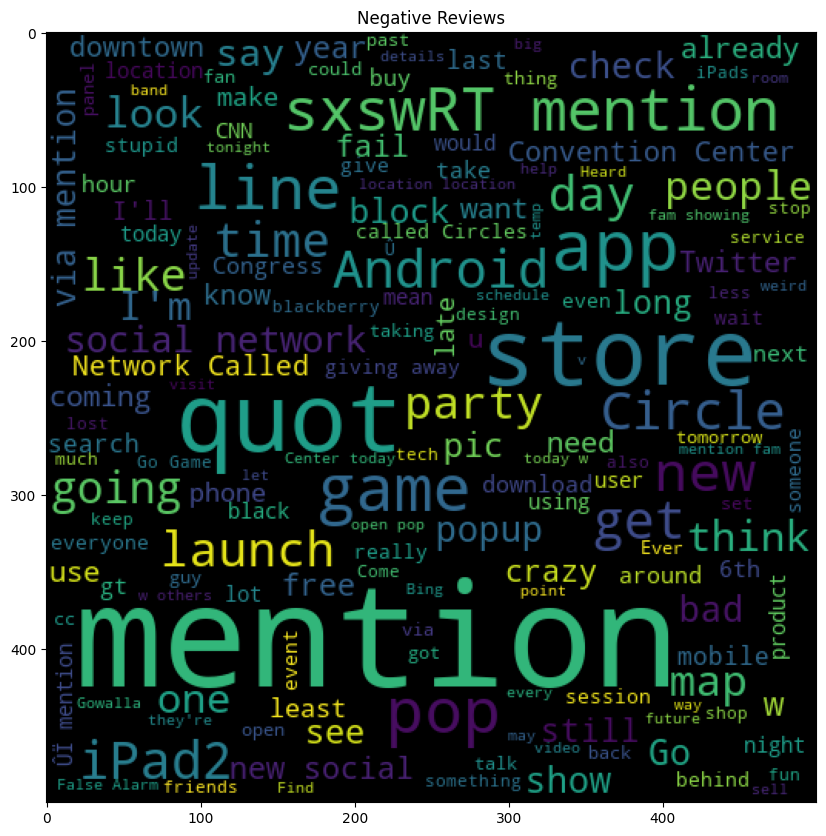

In [77]:
plt.figure(figsize=(10,10))
plt.imshow(Negative)
plt.title('Negative Reviews')
plt.show()

# Neutral reviews WORDCLOUD

In [78]:
Neutral = wc.generate(df[df['Polarity']==0]['Product_Description'].str.cat(sep=""))

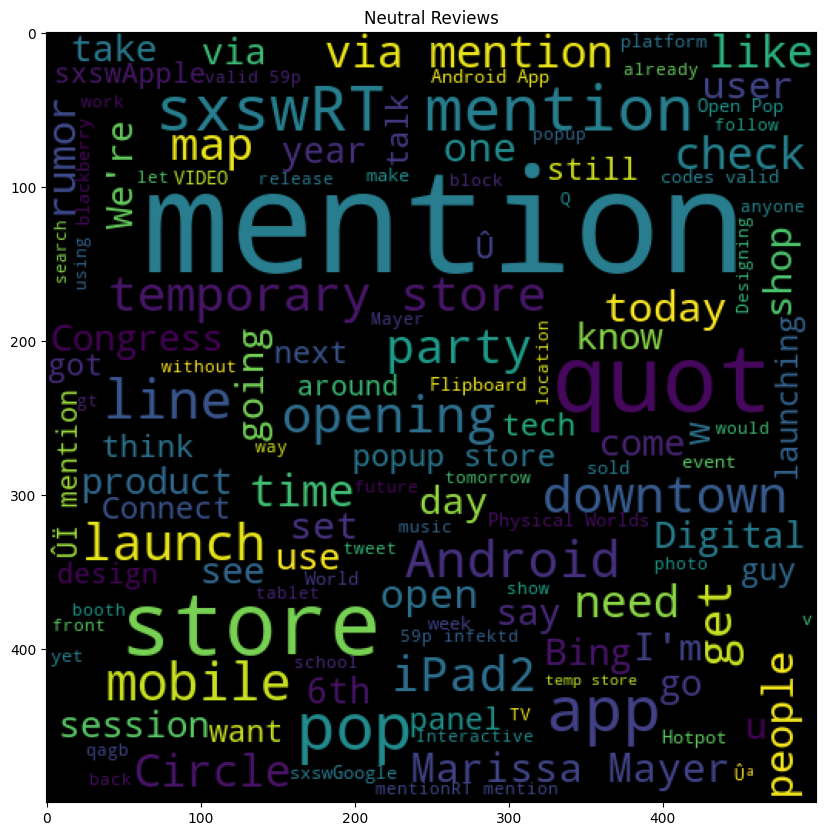

In [79]:
plt.figure(figsize=(10,10))
plt.imshow(Neutral)
plt.title('Neutral Reviews')
plt.show()

# words into vector -BOW,Tf-idf,Wordevec

# BOW/Count Vectorization on positive sentiments/reviews

In [80]:
Positive_senti = [lemma.strip() for lemma in Positive_senti.lemma] # remove both the leading and the trailing characters
Positive_senti = [lemma for lemma in Positive_senti if lemma] # removes empty strings, because they are considered in Python as False
Positive_senti[0:10]

['rt mention line ipad longer today yesterday get line today fun',
 'wow rtmention interrupt regularli schedul geek program big news googl circl',
 'googl launch new social network possibl today',
 'mention welcom enjoy ride anywher austin dwnld groundlink applink booth',
 'yeay rt mention new ubersoci iphon app store includ uberguid sponsor masha',
 'rt mention social import googl screw big launch circu',
 'brace audio onslaught enjoy free music sampler itun featuredartist',
 'thank heathcar digit mention publish news new medic app showcas sxswh',
 'ipad hand awesom dude gave cutsi hour line austin appl win',
 'realli like iphon app thank make event app appear work well']

In [81]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(Positive_senti)

In [82]:
word_freq_df = pd.DataFrame({'term': vectorizer.get_feature_names_out(), 'occurrences':np.asarray(X.sum(axis=0)).ravel().tolist()})

In [83]:
word_freq_df.sort_values('occurrences',ascending=False)

,term,occurrences
2372,mention,2245
3293,rt,1101
1960,ipad,893
1576,googl,761
2537,new,695
...,...,...
2577,nope,1
1007,diari,1
2579,north,1
2581,notch,1


# BOW on Negative words

In [84]:
Negative_senti=Negative_senti['lemma']
Negative_senti=pd.DataFrame(data=Negative_senti)

In [85]:
Negative_senti = [lemma.strip() for lemma in Negative_senti.lemma] # remove both the leading and the trailing characters
Negative_senti = [lemma for lemma in Negative_senti if lemma] # removes empty strings, because they are considered in Python as False
Negative_senti[0:10]

['crazi appl open austin tomorrow handl rabid eye pad seeker',
 'rt mention think ef hubbi line ipad someon point toward lineup wife number',
 'horribl repress memori appl spin beach ball come back progressbar talk',
 'rt mention second day busi appl appear trend vb mention appl store pic',
 'adapt retail appl open popup shop skill done cupertino',
 'rt mention need late night snack mention discov fill option recap day yum',
 'discus pubsubhubbub fsw',
 'download free mention sampler band play',
 'need buy im austin sure ill need q austin appl store',
 'line around austin appl unbeliev technolog junki']

In [86]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(Negative_senti)

In [87]:
print(vectorizer.vocabulary_)

{'crazi': 427, 'appl': 95, 'open': 1285, 'austin': 128, 'tomorrow': 1912, 'handl': 842, 'rabid': 1501, 'eye': 653, 'pad': 1306, 'seeker': 1626, 'rt': 1579, 'mention': 1156, 'think': 1883, 'ef': 575, 'hubbi': 902, 'line': 1073, 'ipad': 977, 'someon': 1713, 'point': 1384, 'toward': 1927, 'lineup': 1074, 'wife': 2086, 'number': 1263, 'horribl': 889, 'repress': 1544, 'memori': 1155, 'spin': 1737, 'beach': 169, 'ball': 152, 'come': 363, 'back': 145, 'progressbar': 1431, 'talk': 1832, 'second': 1622, 'day': 467, 'busi': 267, 'appear': 94, 'trend': 1941, 'vb': 2016, 'store': 1761, 'pic': 1360, 'adapt': 24, 'retail': 1554, 'popup': 1394, 'shop': 1656, 'skill': 1681, 'done': 528, 'cupertino': 443, 'need': 1222, 'late': 1040, 'night': 1243, 'snack': 1695, 'discov': 511, 'fill': 686, 'option': 1288, 'recap': 1521, 'yum': 2158, 'discus': 515, 'pubsubhubbub': 1445, 'fsw': 741, 'download': 536, 'free': 727, 'sampler': 1594, 'band': 155, 'play': 1376, 'buy': 270, 'im': 926, 'sure': 1794, 'ill': 924, 

In [88]:
word_freq_df = pd.DataFrame({'term': vectorizer.get_feature_names_out(), 'occurrences':np.asarray(X.sum(axis=0)).ravel().tolist()})

In [89]:
word_freq_df.sort_values('occurrences',ascending=False)

,term,occurrences
1156,mention,538
1579,rt,259
95,appl,224
977,ipad,204
790,googl,199
...,...,...
944,inertia,1
943,indysaha,1
941,indic,1
936,inc,1


# TFidf Vectorizer on Positive Reviews

In [90]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [91]:
vectorizer_n_gram_max_features = TfidfVectorizer(norm="l2",analyzer='word', ngram_range=(1,3), max_features = 5000)
tf_idf_matrix_n_gram_max_features =vectorizer_n_gram_max_features.fit_transform(Positive_senti)

In [92]:
print(vectorizer_n_gram_max_features.get_feature_names_out())
print(tf_idf_matrix_n_gram_max_features.toarray())

['aapl' 'abil' 'abl' ... 'û_ cont' 'ûò' 'ûó']
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


# TFidf Vectorizer on Negative Reviews

In [93]:
vectorizer_n_gram_max_features = TfidfVectorizer(norm="l2",analyzer='word', ngram_range=(1,3), max_features = 5000)
tf_idf_matrix_n_gram_max_features =vectorizer_n_gram_max_features.fit_transform(Negative_senti)

In [94]:
print(vectorizer_n_gram_max_features.get_feature_names_out())
print(tf_idf_matrix_n_gram_max_features.toarray())

['__' 'academi' 'academi bring' ... 'û_' 'û_ mean' 'û_ mean ipad']
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [95]:
df.head()

,Text_ID,Product_Description,Product_Type,Sentiment,num_words,clean_text,no_contract,tokenized,lower,nostop,stemmed,lemma,Polarity,Subjectivity,Analysis
0,3057,The Web DesignerÛªs Guide to iOS (and Android...,9,2,15,The Web DesignerÛªs Guide to iOS and Android A...,"[The, Web, DesignerÛªs, Guide, to, iOS, and, A...","[The, Web, DesignerÛªs, Guide, to, iOS, and, A...",the web designerûªs guide to ios and android a...,web guide ios android apps today mention,web guid io android app today mention,web guid io android app today mention,0.0,0.0,Neutral
1,6254,RT @mention Line for iPad 2 is longer today th...,9,2,24,RT mention Line for iPad is longer today than...,"[RT, mention, Line, for, iPad, is, longer, tod...","[RT, mention, Line, for, iPad, is, longer, tod...",rt mention line for ipad is longer today than ...,rt mention line ipad longer today yesterday ge...,rt mention line ipad longer today yesterday ge...,rt mention line ipad longer today yesterday ge...,0.3,0.2,Positive
2,8212,Crazy that Apple is opening a temporary store ...,9,2,20,Crazy that Apple is opening a temporary store ...,"[Crazy, that, Apple, is, opening, a, temporary...","[Crazy, that, Apple, is, opening, a, temporary...",crazy that apple is opening a temporary store ...,crazy apple opening austin tomorrow handle rab...,crazi appl open austin tomorrow handl rabid ey...,crazi appl open austin tomorrow handl rabid ey...,-0.6,0.9,Negative
3,4422,The lesson from Google One Pass: In this digit...,9,2,22,The lesson from Google One Pass In this digita...,"[The, lesson, from, Google, One, Pass, In, thi...","[The, lesson, from, Google, One, Pass, In, thi...",the lesson from google one pass in this digita...,lesson google one pass digital environment us...,lesson googl one pass digit environ user want ...,lesson googl one pas digit environ user want p...,0.0,0.0,Neutral
4,5526,RT @mention At the panel: &quot;Your mom has a...,9,2,14,RT mention At the panel quotYour mom has an ip...,"[RT, mention, At, the, panel, quotYour, mom, h...","[RT, mention, At, the, panel, quotYour, mom, h...",rt mention at the panel quotyour mom has an ip...,rt mention panel quotyour mom ipad designing b...,rt mention panel quotyour mom ipad design boom...,rt mention panel quotyour mom boomersquot,0.0,0.0,Neutral


In [96]:
temp.head()

,Product_Description,num_words,Product_Type,Sentiment,Polarity,Subjectivity
0,The Web DesignerÛªs Guide to iOS (and Android...,15,9,2,0.0,0.0
1,RT @mention Line for iPad 2 is longer today th...,24,9,2,0.3,0.2
2,Crazy that Apple is opening a temporary store ...,20,9,2,-0.6,0.9
3,The lesson from Google One Pass: In this digit...,22,9,2,0.0,0.0
4,RT @mention At the panel: &quot;Your mom has a...,14,9,2,0.0,0.0


In [97]:
corpus = df['lemma'].tolist()

In [98]:
corpus

['web guid io android app today mention',
 'rt mention line ipad longer today yesterday get line today fun',
 'crazi appl open austin tomorrow handl rabid eye pad seeker',
 'lesson googl one pas digit environ user want purchas across everi platform one tool elonsxsw',
 'rt mention panel quotyour mom boomersquot',
 'rt mention think ef hubbi line ipad someon point toward lineup wife number',
 'quotandroid user iphon user use option menu contextu menuquot mention',
 'wow rtmention interrupt regularli schedul geek program big news googl circl',
 'googl launch new social network possibl today',
 'mention welcom enjoy ride anywher austin dwnld groundlink applink booth',
 'rt mention appl plan keep austin wire open popup appl store',
 'yeay rt mention new ubersoci iphon app store includ uberguid sponsor masha',
 'know season app updat whenev open iphon app store',
 'rt mention rt mention arriv u look microsim data iphon recommend mention',
 'rumor appl open ipad launch',
 'horribl repress me

In [99]:
df['Analysis'] = df['Analysis'].replace({'Negative': -1})
df['Analysis'] = df['Analysis'].replace({'Positive': 1})
df['Analysis'] = df['Analysis'].replace({'Neutral': 0})

In [100]:
senti_into_number_form=df['Analysis']

In [101]:
senti_into_number_form.head(50)

0     0
1     1
2    -1
3     0
4     0
5    -1
6     0
7     1
8     1
9     1
10    0
11    1
12    0
13    0
14    0
15   -1
16    0
17    1
18   -1
19    1
20    0
21    1
22    0
23    1
24   -1
25    1
26    0
27    0
28    1
29    0
30    1
31    1
32    0
33    1
34    1
35    0
36    0
37   -1
38    0
39    0
40    1
41    1
42    0
43    0
44    0
45    1
46    0
47    1
48    0
49    1
Name: Analysis, dtype: int64

# Corpus converted into array using TFidf

In [102]:
vectorizer4 = TfidfVectorizer(max_features=4000)
idf= vectorizer4.fit_transform(corpus).toarray()

In [103]:
idf

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [104]:
import pickle
pickle_out=open('vectorizer4.pkl','wb')
pickle.dump(vectorizer4,pickle_out)
pickle_out.close()

In [105]:
xtfidf = pd.DataFrame(idf)
xtfidf

,0,1,2,3,4,5,6,7,8,9,...,3990,3991,3992,3993,3994,3995,3996,3997,3998,3999
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6359,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6360,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6361,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6362,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Target var

In [106]:
ytfidf=df['Sentiment']
ytfidf.value_counts() # checking whether data is balanced or imbalanced

2    3765
3    2089
1     399
0     111
Name: Sentiment, dtype: int64

# Test and Split Training Data

In [107]:
from sklearn.model_selection import train_test_split

In [108]:
x_traintfidf, x_testtfidf,y_traintfidf,y_testtfidf = train_test_split(xtfidf,ytfidf, test_size=0.35,random_state=0)

In [109]:
x_traintfidf.shape,y_traintfidf.shape, x_testtfidf.shape,y_testtfidf.shape

((4136, 4000), (4136,), (2228, 4000), (2228,))

# Balancing the splitted (tfidf) data using SMOTE method

In [110]:
from imblearn.over_sampling import SMOTE

In [111]:
upsample = SMOTE()
x_traintfidf1, y_traintfidf1 = upsample.fit_resample(x_traintfidf, y_traintfidf)

In [112]:
#target y
ytfidf1=df['Sentiment']
ytfidf1.value_counts()

2    3765
3    2089
1     399
0     111
Name: Sentiment, dtype: int64

# Model building with balanced data using Tfidf 

In [113]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import pickle
from sklearn.metrics import f1_score,accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1.LogisticRegression

In [114]:
from sklearn.linear_model import LogisticRegression

In [115]:
lr= LogisticRegression()
lr.fit(x_traintfidf1,y_traintfidf1)
y_pred_test_lr=lr.predict(x_testtfidf)
y_pred_train_lr=lr.predict(x_traintfidf1)

c:\python38\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [116]:
# accuracy score
accuracy_train_LR=accuracy_score(y_traintfidf1,y_pred_train_lr)*100
accuracy_test_LR= accuracy_score(y_testtfidf, y_pred_test_lr) * 100
print('Accuracy of Training data =',accuracy_train_LR)
print("Accuracy of Test data =", accuracy_test_LR)

Accuracy of Training data = 91.5207654723127
Accuracy of Test data = 62.74685816876122


In [117]:
print(classification_report(y_testtfidf, y_pred_test_lr))

              precision    recall  f1-score   support

           0       0.07      0.10      0.08        30
           1       0.29      0.36      0.32       146
           2       0.73      0.69      0.71      1309
           3       0.57      0.60      0.58       743

    accuracy                           0.63      2228
   macro avg       0.42      0.43      0.42      2228
weighted avg       0.64      0.63      0.63      2228



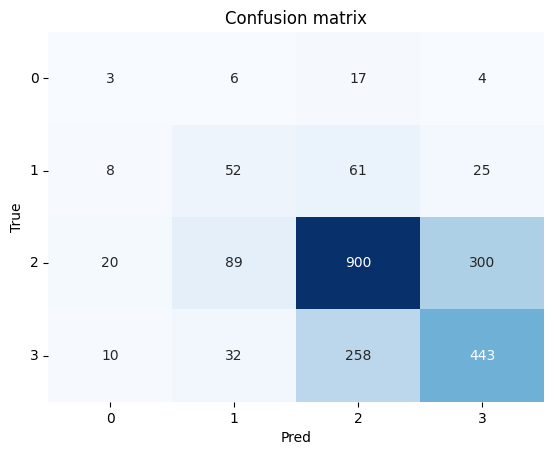

In [118]:
from sklearn import metrics
classes = np.unique(y_testtfidf)
cm0 = metrics.confusion_matrix(y_testtfidf, y_pred_test_lr)
fig, ax = plt.subplots()
sns.heatmap(cm0, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues, 
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=classes, 
       yticklabels=classes, title="Confusion matrix")
plt.yticks(rotation=0);

# 2.Random Forest

In [119]:
from sklearn.ensemble import RandomForestClassifier

In [120]:
RF= RandomForestClassifier()
RF.fit(x_traintfidf1,y_traintfidf1)
y_pred_test_RF=RF.predict(x_testtfidf)
y_pred_train_RF=RF.predict(x_traintfidf1)


In [121]:
# accuracy score
accuracy_train_RF=accuracy_score(y_traintfidf1,y_pred_train_RF)*100
accuracy_test_RF= accuracy_score(y_testtfidf, y_pred_test_RF) * 100
print('Accuracy of Training data =',accuracy_train_RF)
print("Accuracy of Test data =", accuracy_test_RF)

Accuracy of Training data = 99.64372964169381
Accuracy of Test data = 64.94614003590664


In [122]:
print(classification_report(y_testtfidf, y_pred_test_RF))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        30
           1       0.54      0.14      0.22       146
           2       0.67      0.84      0.75      1309
           3       0.60      0.44      0.51       743

    accuracy                           0.65      2228
   macro avg       0.45      0.35      0.37      2228
weighted avg       0.63      0.65      0.62      2228



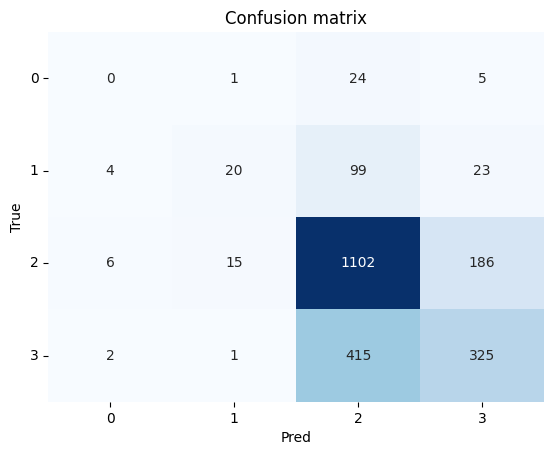

In [123]:
from sklearn import metrics
classes = np.unique(y_testtfidf)
cm0 = metrics.confusion_matrix(y_testtfidf, y_pred_test_RF)
fig, ax = plt.subplots()
sns.heatmap(cm0, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues, 
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=classes, 
       yticklabels=classes, title="Confusion matrix")
plt.yticks(rotation=0);

# 3. SVM

In [124]:
from sklearn.svm import LinearSVC

In [125]:
SVM= LinearSVC()
SVM.fit(x_traintfidf1,y_traintfidf1)
y_pred_test_SVM=SVM.predict(x_testtfidf)
y_pred_train_SVM=SVM.predict(x_traintfidf1)

In [126]:
print(classification_report(y_testtfidf, y_pred_test_SVM))

              precision    recall  f1-score   support

           0       0.07      0.10      0.08        30
           1       0.31      0.33      0.32       146
           2       0.72      0.70      0.71      1309
           3       0.56      0.57      0.57       743

    accuracy                           0.62      2228
   macro avg       0.41      0.42      0.42      2228
weighted avg       0.63      0.62      0.63      2228



In [127]:
accuracy_train_SVM=accuracy_score(y_traintfidf1,y_pred_train_SVM)*100
accuracy_test_SVM= accuracy_score(y_testtfidf, y_pred_test_SVM) * 100
print('Accuracy of Training data =',accuracy_train_SVM)
print("Accuracy of Test data =", accuracy_test_SVM)

Accuracy of Training data = 95.24633550488599
Accuracy of Test data = 62.34290843806104


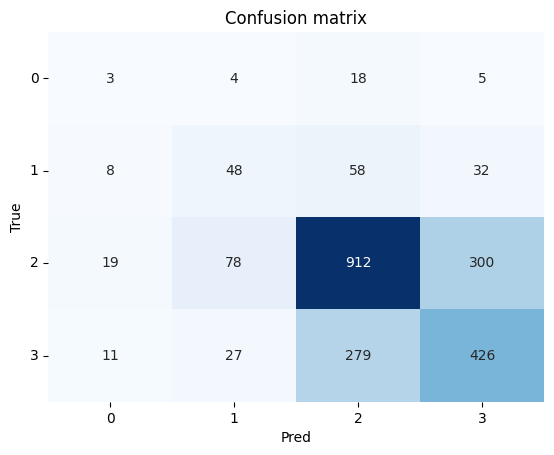

In [128]:
from sklearn import metrics
classes = np.unique(y_testtfidf)
cm0 = metrics.confusion_matrix(y_testtfidf, y_pred_test_SVM)
fig, ax = plt.subplots()
sns.heatmap(cm0, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues, 
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=classes, 
       yticklabels=classes, title="Confusion matrix")
plt.yticks(rotation=0);

# 4. Naive Bayes classifier for multinomial models

In [129]:
from sklearn.naive_bayes import MultinomialNB

In [130]:
MULT_NB= MultinomialNB()
MULT_NB.fit(x_traintfidf1,y_traintfidf1)
y_pred_test_mult_nb=MULT_NB.predict(x_testtfidf)
y_pred_train_mult_nb=MULT_NB.predict(x_traintfidf1)

In [131]:
accuracy_train_MULT_NB=accuracy_score(y_traintfidf1,y_pred_train_mult_nb)*100
accuracy_test_MULT_NB= accuracy_score(y_testtfidf, y_pred_test_mult_nb) * 100
print('Accuracy of Training data =',accuracy_train_MULT_NB)
print("Accuracy of Test data =", accuracy_test_MULT_NB)

Accuracy of Training data = 86.90960912052117
Accuracy of Test data = 54.263913824057454


In [132]:
print(classification_report(y_testtfidf, y_pred_test_mult_nb))

              precision    recall  f1-score   support

           0       0.03      0.13      0.05        30
           1       0.22      0.43      0.29       146
           2       0.75      0.53      0.62      1309
           3       0.50      0.59      0.55       743

    accuracy                           0.54      2228
   macro avg       0.38      0.42      0.38      2228
weighted avg       0.62      0.54      0.57      2228



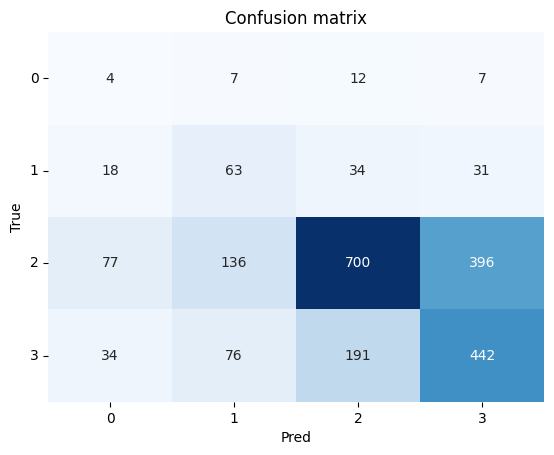

In [133]:
from sklearn import metrics
classes = np.unique(y_testtfidf)
cm0 = metrics.confusion_matrix(y_testtfidf, y_pred_test_mult_nb)
fig, ax = plt.subplots()
sns.heatmap(cm0, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues, 
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=classes, 
       yticklabels=classes, title="Confusion matrix")
plt.yticks(rotation=0);

# 5. AdaBoost classifier on tfidf features

In [134]:
from sklearn.ensemble import AdaBoostClassifier

In [135]:
ADA= AdaBoostClassifier()
ADA.fit(x_traintfidf1,y_traintfidf1)
y_pred_test_ada=ADA.predict(x_testtfidf)
y_pred_train_ada=ADA.predict(x_traintfidf1)

In [136]:
accuracy_train_ADA=accuracy_score(y_traintfidf1,y_pred_train_ada)*100
accuracy_test_ADA= accuracy_score(y_testtfidf, y_pred_test_ada) * 100
print('Accuracy of Training data =',accuracy_train_ADA)
print("Accuracy of Test data =", accuracy_test_ADA)

Accuracy of Training data = 55.9242671009772
Accuracy of Test data = 39.94614003590664


In [137]:
print(classification_report(y_testtfidf, y_pred_test_ada))

              precision    recall  f1-score   support

           0       0.04      0.03      0.04        30
           1       0.08      0.35      0.13       146
           2       0.60      0.54      0.57      1309
           3       0.34      0.17      0.23       743

    accuracy                           0.40      2228
   macro avg       0.27      0.27      0.24      2228
weighted avg       0.47      0.40      0.42      2228



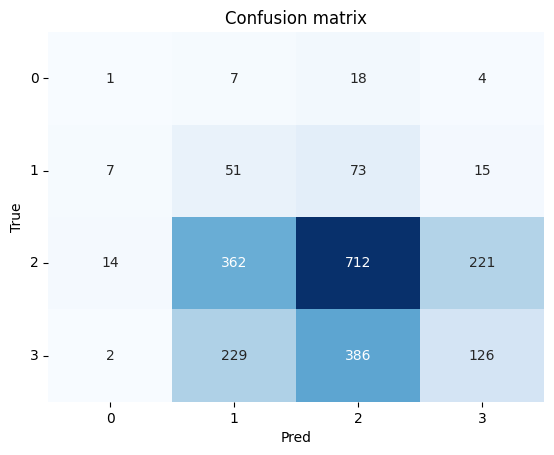

In [138]:
from sklearn import metrics
classes = np.unique(y_testtfidf)
cm0 = metrics.confusion_matrix(y_testtfidf, y_pred_test_ada)
fig, ax = plt.subplots()
sns.heatmap(cm0, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues, 
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=classes, 
       yticklabels=classes, title="Confusion matrix")
plt.yticks(rotation=0);

# 6. KNN

In [139]:
from sklearn.model_selection import KFold
from sklearn.neighbors import KNeighborsClassifier

In [140]:
KNN= AdaBoostClassifier()
KNN.fit(x_traintfidf1,y_traintfidf1)
y_pred_test_KNN=KNN.predict(x_testtfidf)
y_pred_train_KNN=KNN.predict(x_traintfidf1)

In [141]:
accuracy_train_KNN=accuracy_score(y_traintfidf1,y_pred_train_ada)*100
accuracy_test_KNN= accuracy_score(y_testtfidf, y_pred_test_ada) * 100
print('Accuracy of Training data =',accuracy_train_KNN)
print("Accuracy of Test data =", accuracy_test_KNN)

Accuracy of Training data = 55.9242671009772
Accuracy of Test data = 39.94614003590664


In [142]:
print(classification_report(y_testtfidf, y_pred_test_KNN))

              precision    recall  f1-score   support

           0       0.04      0.03      0.04        30
           1       0.08      0.35      0.13       146
           2       0.60      0.54      0.57      1309
           3       0.34      0.17      0.23       743

    accuracy                           0.40      2228
   macro avg       0.27      0.27      0.24      2228
weighted avg       0.47      0.40      0.42      2228



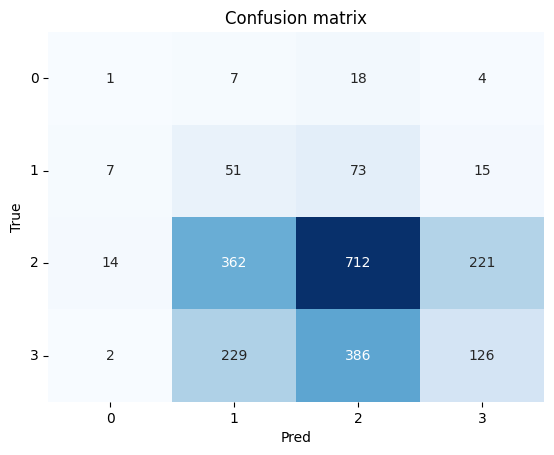

In [143]:
from sklearn import metrics
classes = np.unique(y_testtfidf)
cm0 = metrics.confusion_matrix(y_testtfidf, y_pred_test_KNN)
fig, ax = plt.subplots()
sns.heatmap(cm0, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues, 
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=classes, 
       yticklabels=classes, title="Confusion matrix")
plt.yticks(rotation=0);

# 7. XGBoost

In [144]:
from numpy import loadtxt
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [145]:
XGB = XGBClassifier()
XGB.fit(x_traintfidf1,y_traintfidf1)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', ...)

In [146]:
# make predictions for test data
y_pred_test_XGB = XGB.predict(x_testtfidf)
y_pred_train_XGB = XGB.predict(x_traintfidf1)

In [147]:
accuracy_train_XGB=accuracy_score(y_traintfidf1,y_pred_train_ada)*100
accuracy_test_XGB= accuracy_score(y_testtfidf, y_pred_test_ada) * 100
print('Accuracy of Training data =',accuracy_train_XGB)
print("Accuracy of Test data =", accuracy_test_XGB)

Accuracy of Training data = 55.9242671009772
Accuracy of Test data = 39.94614003590664


In [148]:
print(classification_report(y_testtfidf, y_pred_test_XGB))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        30
           1       0.38      0.16      0.23       146
           2       0.69      0.78      0.73      1309
           3       0.56      0.51      0.53       743

    accuracy                           0.64      2228
   macro avg       0.41      0.36      0.37      2228
weighted avg       0.62      0.64      0.62      2228



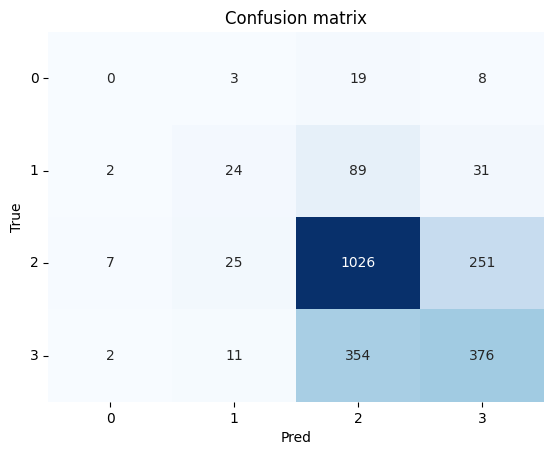

In [149]:
from sklearn import metrics
classes = np.unique(y_testtfidf)
cm0 = metrics.confusion_matrix(y_testtfidf, y_pred_test_XGB)
fig, ax = plt.subplots()
sns.heatmap(cm0, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues,
            cbar=False)
ax.set(xlabel="Pred", ylabel="True", xticklabels=classes,
       yticklabels=classes, title="Confusion matrix")
plt.yticks(rotation=0);

# Saving the Best Model

In [159]:
filename = 'saved_lr_model.pkl'
pickle.dump(lr,open(filename,'wb'))

In [160]:
loaded_model = pickle.load(open(filename, 'rb'))
loaded_model.predict(x_testtfidf)

array([2, 3, 2, ..., 2, 2, 2], dtype=int64)